#  Team 3 - Final Project -Part A  : NLP Based Text Clustering

### Data Science Lifecycle:

1. Problem Definition
2. Data Cleaning
3. Data Conversion 
4. Exploratory Data Analysis & Data Visualization
5. Data Segmentation using Clustering

### 1. Problem Definition

1) 1180 sentences pertaining to different religions without labels are given to us. We need to identify optimal no.of clusters and label them accordingly.

2) Explore different methods of optimal no. of clusters

3) Experiement and explain Depth Difference (DeD) method 

4) Use embedding techniques to convert text data into numeric

**Objective**

- The objective is to segment the text data into logical clusters so that each cluster can be labelled appropriately based on type of text content

**Data**
- Complete_data.txt

In [1]:
import numpy as np
import pandas as pd
import nltk
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
import re
from gensim.models import Word2Vec
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text   #pip install adjustText
#For dimentionality reduction
from sklearn.manifold import TSNE
import statistics as st
from mpl_toolkits import mplot3d

#Package for hierarchical clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
# To plot clusters
from scipy.cluster.hierarchy import dendrogram, linkage
from wordcloud import WordCloud
# importing PCA for dimentionality reduction
from sklearn.decomposition import PCA
#Importing Silhoutte score to measure cluster seperability
from sklearn.metrics import silhouette_score, silhouette_samples

import warnings
import os


In [47]:
# Loading the dataset
os.chdir("D:\Smita\DigitalSkillsAcademy\DATA")
warnings.filterwarnings("ignore")
pd.set_option("max_columns",None)

file = open("Complete_data.txt", 'r')
lines = file.readlines()  
print("No. of lines in data : ", len(lines))

No. of lines in data :  1180


**Observation:**
Given data has 1180 different text lines in it.

In [89]:
lines[0:2]

['0.1\n',
 '§ 1. The Buddha: "What do you think, Rahula: What is a mirror for?"The Buddha:Rahula: "For reflection, sir."Rahula:The Buddha: "In the same way, Rahula, bodily acts, verbal acts, & mental acts are to be done with repeated reflection.The Buddha:"Whenever you want to perform a bodily act, you should reflect on it: \'This bodily act I want to perform — would it lead to self-affliction, to the affliction of others, or to both? Is it an unskillful bodily act, with painful consequences, painful results?\' If, on reflection, you know that it would lead to self-affliction, to the affliction of others, or to both; it would be an unskillful bodily act with painful consequences, painful results, then any bodily act of that sort is absolutely unfit for you to do. But if on reflection you know that it would not cause affliction... it would be a skillful bodily act with happy consequences, happy results, then any bodily act of that sort is fit for you to do.(Similarly with verbal acts & 

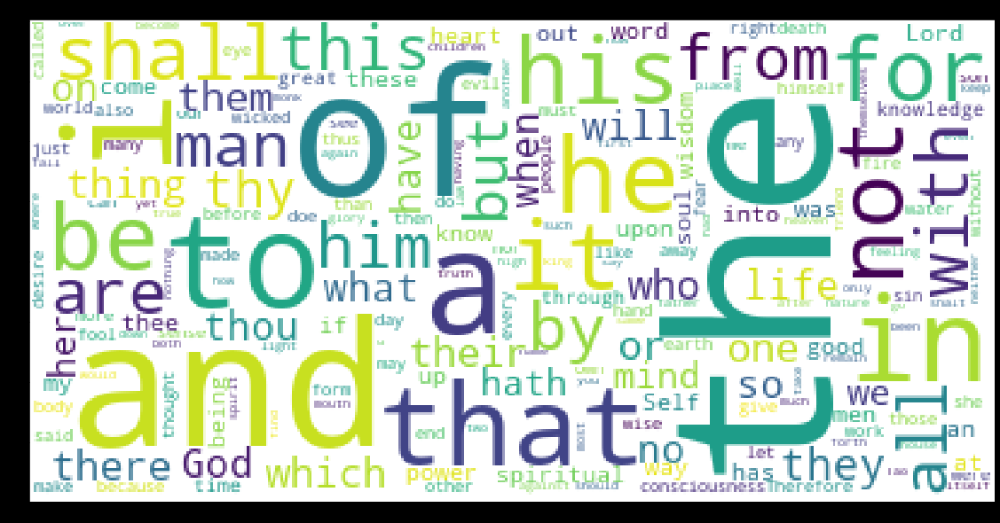

In [64]:
#Visualize raw data
stop_words = []
wordcloud = WordCloud(stopwords=stop_words, collocations=False, background_color="white",width=400,height=200)\
.generate(' '.join(lines))
plt.figure(figsize=(20,10), facecolor='k') 
title = "Raw Text Data"
plt.title(title)
plt.imshow(wordcloud)

**Observation:**
Many common words like the, and, that, a etc are present in the data.

### Data Cleaning

In [3]:
# Preprocessing - data cleaning
sent_count=0
docs = []
wl = WordNetLemmatizer()
for i in range(len(lines)):
    text = re.sub('[^a-zA-Z]',' ', lines[i])   #[^a-zA-Z.]
    text = text.lower()
    sentences = nltk.sent_tokenize(text)
    sent_count += len(sentences)
    for i in range(len(sentences)):
        words = nltk.word_tokenize(sentences[i])
        clean_sent = ' '.join([wl.lemmatize(word, pos='v') for word in words\
                          if word not in stopwords.words('english') ])
        docs.append(clean_sent)
        
doc1 = list(filter(lambda doc: len(doc) > 1, docs))
df = pd.DataFrame(np.array(doc1), columns = ['sentences'])
corpus = df['sentences']
print("No. of clean lines : ",len(corpus))

No. of clean sentences :  589


In [ ]:
#Visualize cleaned text data
clusterdata=corpus
wordcloud = WordCloud(background_color="white",width=1600,height=800)\
.generate(' '.join(clusterdata))
plt.figure(figsize=(20,10), facecolor='k') 
title = "Cleaned Text Data"
plt.title(title)
plt.imshow(wordcloud)

**Observation:**
1. After cleaning the text (removing punctuations, special characters etc), we get 589 clean lines.
2. Lemmatization has converted words to it's base form e.g. destroyed is converted to destroy

In [93]:
corpus

0      buddha think rahula mirror buddha rahula refle...
1      bless one stay kosambi simsapa tree grove pick...
2      stress know cause stress come play know divers...
3      vision arise clear know arise discernment aris...
4      sariputta three form stressfulness friend stre...
                             ...                        
584    condemn makers worshippers idols thou god art ...
585    worthily punish destroy multitude beasts inste...
586    thy judgments lord great thy word express ther...
587    intercession sedition occasion core thy saint ...
588    creatures obey god order service good punishme...
Name: sentences, Length: 589, dtype: object

### Text Embedding using TFIDF

In [4]:
# Converting text data to numeric using TFIDF word embedding technique
vectorizer = TfidfVectorizer(stop_words='english')
vectors  = vectorizer.fit_transform(corpus)  
feature_names = vectorizer.get_feature_names()
dense = vectors.todense()
denselist = dense.tolist()
tf_df = pd.DataFrame(denselist, columns=feature_names)

In [5]:
tf_df.shape

(589, 6102)

In [36]:
tf_df

aaron  abandon  abase  abasement  abash  abate   abateth  aberrant  \
0      0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
1      0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
2      0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
3      0.0  0.08468    0.0        0.0    0.0    0.0  0.000000       0.0   
4      0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
..     ...      ...    ...        ...    ...    ...       ...       ...   
584    0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
585    0.0  0.00000    0.0        0.0    0.0    0.0  0.052032       0.0   
586    0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
587    0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   
588    0.0  0.00000    0.0        0.0    0.0    0.0  0.000000       0.0   

     abhor  abhorreth  abide  abideth  abilities  ability  abiron      able  \
0      0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
1      0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
2      0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
3      0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
4      0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
..     ...        ...    ...      ...        ...      ...     ...       ...   
584    0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
585    0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.028090   
586    0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.041435   
587    0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   
588    0.0        0.0    0.0      0.0        0.0      0.0     0.0  0.000000   

     abnormal  abodes  abolish  abominable  abomination  abominations  abound  \
0         0.0     0.0      0.0         0.0          0.0           0.0     0.0   
1         0.0     0.0      0.0         0.0          0.0           0.0     0.0   
2         0.0     0.0      0.0         0.0          0.0           0.0     0.0   
3         0.0     0.0      0.0         0.0          0.0           0.0     0.0   
4         0.0     0.0      0.0         0.0          0.0           0.0     0.0   
..        ...     ...      ...         ...          ...           ...     ...   
584       0.0     0.0      0.0         0.0          0.0           0.0     0.0   
585       0.0     0.0      0.0         0.0          0.0           0.0     0.0   
586       0.0     0.0      0.0         0.0          0.0           0.0     0.0   
587       0.0     0.0      0.0         0.0          0.0           0.0     0.0   
588       0.0     0.0      0.0         0.0          0.0           0.0     0.0   

     aboundeth  abraham  abroad  absence  absent  absolute  absolutely  \
0          0.0      0.0     0.0      0.0     0.0       0.0    0.024481   
1          0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
2          0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
3          0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
4          0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
..         ...      ...     ...      ...     ...       ...         ...   
584        0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
585        0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
586        0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
587        0.0      0.0     0.0      0.0     0.0       0.0    0.000000   
588        0.0      0.0     0.0      0.0     0.0       0.0    0.000000   

     absorb  absorption  abstain  abstaineth  abstinence  abstinences  \
0       0.0         0.0      0.0         0.0         0.0          0.0   
1       0.0         0.0      0.0         0.0         0.0          0.0   
2       0.0         0.0      0.0         0.0         0.0          0.0   
3

In [8]:
#View text data converted to numeric
dfview=tf_df.set_index(corpus)
dfview.iloc[0:10,0:4]

,aaron,abandon,abandoned,abandoning
sentences,,,,
buddha think rahula mirror buddha rahula reflection sir rahula buddha way rahula bodily act verbal act mental act done repeated reflection buddha whenever want perform bodily act reflect bodily act want perform would lead self affliction affliction others unskillful bodily act painful consequence painful result reflection know would lead self affliction affliction others would unskillful bodily act painful consequence painful result bodily act sort absolutely unfit reflection know would cause affliction would skillful bodily act happy consequence happy result bodily act sort fit similarly verbal act mental act performing bodily act reflect bodily act leading self affliction affliction others unskillful bodily act painful consequence painful result reflection know leading self affliction affliction others give reflection know may continue similarly verbal act mental act performed bodily act reflect reflection know led self affliction affliction others unskillful bodily act painful consequence painful result confess reveal lay open teacher knowledgeable companion holy life confessed exercise restraint future reflection know lead affliction skillful bodily act happy consequence happy result stay mentally refreshed joyful training day night skillful mental quality similarly verbal act performed mental act reflect reflection know led self affliction affliction others unskillful mental act painful consequence painful result feel horrified humiliated disgusted feeling horrified exercise restraint future reflection know lead affliction skillful mental act happy consequence happy result stay mentally refreshed joyful training day night skillful mental quality rahula brahman contemplative course past purified bodily act verbal act mental act repeated reflection bodily act verbal act mental act way brahman contemplative course future brahman contemplative present purify bodily act verbal act mental act repeated reflection bodily act verbal act mental act way rahula train purify bodily act repeated reflection purify verbal act repeated reflection purify mental act repeated reflection train blessed one said gratified ven rahula delighted blessed one word,0.0,0.0,0.000000,0.0
blessed one staying kosambi simsapa tree grove picking simsapa leaf hand asked monk think monk numerous simsapa leaf hand overhead simsapa grove leaf hand blessed one number lord overhead grove far numerous way monk thing known direct knowledge taught far numerous thing taught taught connected goal relate rudiment holy life lead disenchantment dispassion cessation calm direct knowledge self awakening unbinding taught taught stress origination stress cessation stress path practice leading cessation stress taught taught thing connected goal relate rudiment holy life lead disenchantment dispassion cessation calm direct knowledge self awakening unbinding taught therefore duty contemplation stress origination stress cessation stress path practice leading cessation stress,0.0,0.0,0.000000,0.0
stress known cause stress come play known diversity stress known result stress known cessation stress known path practice cessation stress known thus said said birth stressful aging stressful death stressful sorrow lamentation pain distress despair stressful association loved stressful separation loved stressful getting wanted stressful short five clinging aggregate stressful cause stress come play craving cause stress come play diversity stress major stress minor slowly fading quickly fading called diversity stress result stress case person overcome pain mind exhausted grief mourns lament beat breast becomes bewildered one overcome pain mind exhausted come search outside know way two stop pain tell monk stress result either bewilderment search cessation stress cessation craving cessation stress noble eightfold path path practice leading cessation stress right view right resolve right speech right action right livelihood right effort rig

### Text Embedding using CountVectorizer

In [33]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
cv_vector=cv.fit_transform(corpus).toarray()
cv_df = pd.DataFrame(cv_vector, columns = cv.vocabulary_)
cv_df.shape

(589, 6259)

In [34]:
cv_df

buddha  think  rahula  mirror  reflection  sir  way  bodily  act  verbal  \
0         0      0       0       0           0    0    0       0    0       0   
1         0      0       0       0           0    0    0       0    0       0   
2         0      0       0       0           0    0    0       0    0       0   
3         0      2       0       0           0    0    0       0    0       0   
4         0      0       0       0           0    0    0       0    0       0   
..      ...    ...     ...     ...         ...  ...  ...     ...  ...     ...   
584       0      0       0       0           0    0    0       0    0       0   
585       0      0       0       0           0    0    1       0    0       0   
586       0      0       0       0           0    0    0       0    0       0   
587       0      0       0       0           0    0    0       0    0       0   
588       0      0       0       0           0    0    0       0    0       0   

     mental  do  repeat  whenever  want  perform  reflect  would  lead  self  \
0         0   0       0         0     0        0        0      0     0     0   
1         0   0       0         0     0        0        0      0     0     0   
2         0   0       0         0     0        0        0      0     0     0   
3         0   0       0         0     0        0        0      0     0     0   
4         0   0       0         0     0        0        0      0     0     0   
..      ...  ..     ...       ...   ...      ...      ...    ...   ...   ...   
584       0   0       0         0     0        0        0      0     0     0   
585       0   0       0         0     0        1        0      0     0     0   
586       0   0       0         0     0        1        0      0     0     0   
587       0   0       0         0     0        0        0      0     0     0   
588       0   0       0         0     0        0        0      0     0     0   

     affliction  others  unskillful  painful  consequences  result  know  \
0             0       0           0        0             0       0     0   
1             0       0           0        0             0       0     0   
2             0       0           0        0             0       0     0   
3             0       0           0        0             0       0     0   
4             0       0           0        0             0       0     0   
..          ...     ...         ...      ...           ...     ...   ...   
584           0       0           0        0             0       0     0   
585           0       0           0        0             0       0     0   
586           0       0           0        0             0       0     0   
587           0       0           0        0             0       0     0   
588           0       0           0        0             0       0     0   

     sort  absolutely  unfit  cause  skillful  happy  fit  similarly  give  \
0       0           0      1      0         0      0    0          0     0   
1       0           0      0      0         0      0    0          0     0   
2       0           0      0      0         0      0    0          0     0   
3       0           0      0      0         0      0    0          0     0   
4       0           0      0      0         0      0    0          0     0   
..    ...         ...    ...    ...       ...    ...  ...        ...   ...   
584     0           0      0      0         0      0    0          0     0   
585     0           0      0      0         0      0    0          0     0   
586     0           0      0      0         0      0    0          0     0   
587     0           0      0      0         0      0    0          0     0   
588     0           0      0      0         0      0    0          0     0   

     may  continue  confess  reveal  lay  open  teacher  knowledgeable  \
0      0         0        0       0    0     0        0              0   
1      0         0        0       0    0     0        0              0   

**Observation:**
1. Count vectorier is giving sparse matrix based on frequence of word appearing in sentence.

###  Dimentionality Reduction using PCA on TFIDF generated matrix

In [6]:
#Dimentionality reduction using sklearn PCA
pca = PCA(n_components=0.95)
tf_pca = pca.fit_transform(tf_df)
tf_pca.shape

(589, 487)

In [7]:
tf_pca

array([[-0.11175122, -0.05027314, -0.03121333, ...,  0.02727655,
         0.02198972,  0.06015316],
       [-0.09376615, -0.05293873, -0.04079513, ..., -0.05943734,
        -0.03208265, -0.02229695],
       [-0.10998769, -0.08626706, -0.06310916, ..., -0.00048585,
         0.02653828,  0.03310622],
       ...,
       [ 0.03561542, -0.04031887,  0.00417432, ...,  0.01390312,
         0.00712102, -0.01092679],
       [ 0.18154285, -0.17449933,  0.14799701, ..., -0.01730275,
         0.02556039, -0.03686859],
       [ 0.12691062, -0.10271712,  0.10515662, ...,  0.03375576,
         0.00422925, -0.02715184]])

**Observation:**
1. TFIDF matrix dimentionality is reduced from 6102 to 487.

###  Dimentionality Reduction using PCA on Count Vectorizer generated matrix

In [35]:
#Dimentionality reduction using sklearn PCA
pca = PCA(n_components=0.95)
cv_pca = pca.fit_transform(cv_df)
cv_pca.shape

(589, 269)

**Observation:**
1. Data dimentions are reduced from 6259 to 269 PCs

### 3. Data Visualization:

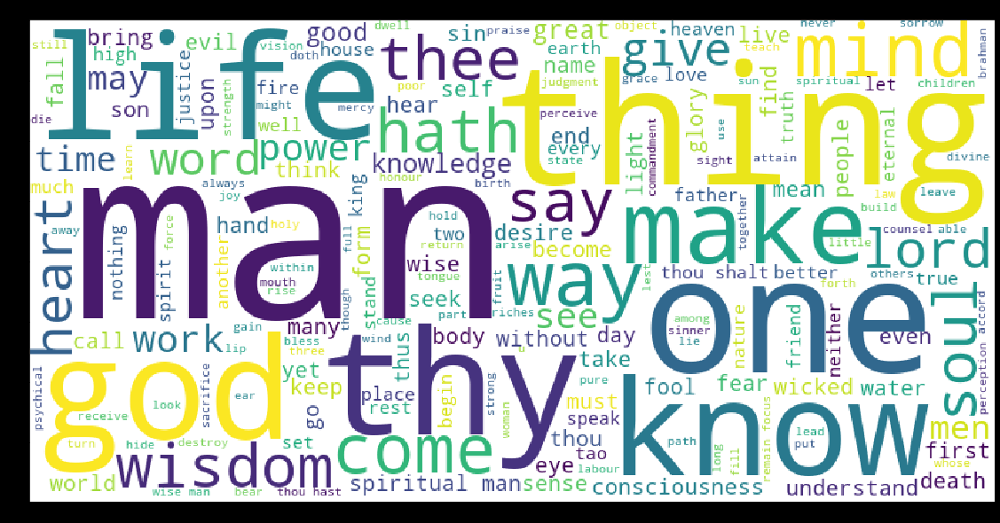

In [65]:
#Visualize cleaned text data
wordcloud = WordCloud(collocations=False, background_color="white",width=800,height=400)\
.generate(' '.join(corpus))
plt.figure(figsize=(20,10), facecolor='k') 
title = "Cleaned Text Data"
plt.title(title)
plt.imshow(wordcloud)

# Find Optimal K value

### a) Elbow method with PCA data & original data

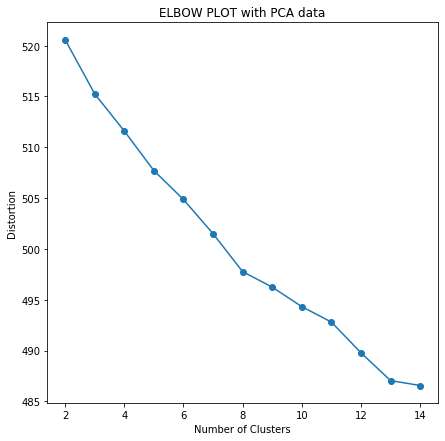

In [68]:
#Finding optimal K value using Elbow method        
# List to store wss
distortions=[] 
for i in range(2, 15):
    km = KMeans(n_clusters=i, 
                        init='k-means++',
                        n_init=10,  # make 10 rounds in each iteration to finalize centroid
                        max_iter=300, #Max iterations to finalize centroid
                        random_state=100) 
    km.fit(tf_pca)
    distortions.append(km.inertia_) #inertia means wcss

#Plotting K-means elbow plot
plt.figure(figsize=(7,7))
plt.plot(range(2,15), distortions, marker='o')
plt.title('ELBOW PLOT with PCA data')
plt.xlabel('Number of Clusters')
plt.ylabel("Distortion")
plt.show()

**Observation:**
1. Elbow method shows a slight bend at k=8, however it's not very clear. Let's try other methods to find optimal K value. 

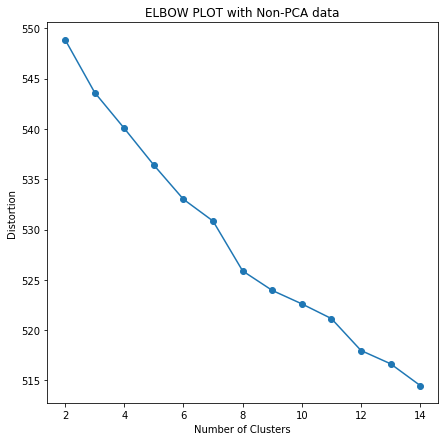

In [67]:
#Finding optimal K value using Elbow method with non-PCA data      
# List to store wss
distortions=[] 
for i in range(2, 15):
    km = KMeans(n_clusters=i, 
                        init='k-means++',
                        n_init=10,  # make 10 rounds in each iteration to finalize centroid
                        max_iter=300, #Max iterations to finalize centroid
                        random_state=100) 
    km.fit(tf_df)
    distortions.append(km.inertia_) #inertia means wcss

#Plotting K-means elbow plot
plt.figure(figsize=(7,7))
plt.plot(range(2,15), distortions, marker='o')
plt.title('ELBOW PLOT with Non-PCA data')
plt.xlabel('Number of Clusters')
plt.ylabel("Distortion")
plt.show()

**Observation:**
1. Elbow method shows a slight bend at k=7 and then at at k=8, however it's not very clear. Let's try other methods to find optimal K value. 

### b) Silhoutte method

In [48]:
# Function to get Silhoutte score - to measure degree of seperability between clusters
def find_silhoutte(data1):
    # List to store wcss
    silhoutteScore=dict()
    # for K values 2 thru 11, measure wcss
    for i in range(2, 15):
        km =KMeans(n_clusters=i, 
                            init='k-means++',
                            n_init=10,  # make 10 rounds in each iteration to finalize centroid
                            max_iter=300, #Max iterations to finalize centroid
                            random_state=100) 
        km.fit_predict(data1)
        silhoutteAvg = silhouette_score(data1, km.labels_, metric='euclidean')
        silhoutteScore[i]=silhoutteAvg # Silhoutte score
                
    #Plotting K Vs Solhoutte score
    plt.figure(figsize=(7,7))
    plt.plot(range(2,15), list(silhoutteScore.values()), marker='o')
    plt.title('SILHOUTTE SCORE')
    plt.xlabel('Number of Clusters')
    plt.ylabel("Silhoutte Score")
    plt.show()
    return silhoutteScore

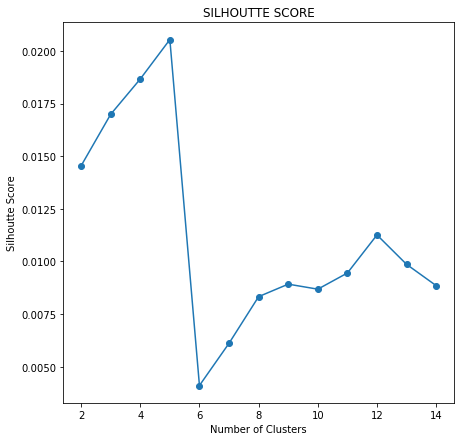

{2: 0.014541691596557679,
 3: 0.01698840684656701,
 4: 0.018665902121570353,
 5: 0.020538777021782934,
 6: 0.004110638009346011,
 7: 0.006116160915045204,
 8: 0.008330693536134307,
 9: 0.008923982744018307,
 10: 0.008685379254815547,
 11: 0.009453341891962366,
 12: 0.011260634857155725,
 13: 0.009864010326356198,
 14: 0.008853745456940771}

In [49]:
# Find optimal K using Silhoutte score with PCA data
scores = find_silhoutte(tf_pca)
scores

**Observation:**
1. Silhoutte method shows optimal k as 5 on PCA data

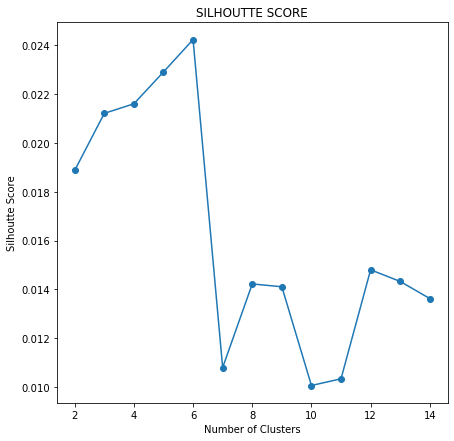

{2: 0.01887531797072479,
 3: 0.021214514294693475,
 4: 0.021606758094860498,
 5: 0.022910682831594625,
 6: 0.024239221987536537,
 7: 0.010792933402410448,
 8: 0.014221027957638886,
 9: 0.01410502113855507,
 10: 0.010057072394454303,
 11: 0.010332217935977656,
 12: 0.014800906565103513,
 13: 0.014322476210374161,
 14: 0.013622698610855561}

In [99]:
# Find optimal K using Silhoutte score with non-PCA data
scores = find_silhoutte(tf_df)
scores

**Observation:**
1. Silhoutte method shows highest score for k=6 with non-PCA data

### c) Depth Difference using Mahalanobis Depth method

In [41]:
# Function to find Mahalanobis Depth
def mahalanobisDepth(data):
    # MD(x;Xi)=[1+(xâˆ’Xi)TCov(X)âˆ’1(xâˆ’Xi)]âˆ’1
    x_minus_Xi = data - np.median(data, axis=0)
    cov = np.cov(data.T)
    #inv_cov = np.linalg.pinv(cov)
    inv_cov = np.linalg.pinv(cov)
    dot1 = np.dot(x_minus_Xi, inv_cov)   #order of metrics matter
    dotp = np.dot(dot1, x_minus_Xi.T)
    mahalanobis = np.linalg.pinv(1+dotp)
    return mahalanobis.diagonal()

In [79]:
df_x = pd.DataFrame(tf_pca)
df_x['Di'] = mahalanobisDepth(df_x)
# DeD algorithm to final Optimal K value
#dfx['Di'] -> Depth of each point in X
# DM = Depth Median of dataset X
DM = np.max(df_x['Di'])
# n = Length of dataset X
n = len(df_x)
Bigdelta = np.average(np.absolute(df_x['Di']-DM))
DeDK = pd.DataFrame(columns=['K','DW','DB','DeD'])
cluster=[]
for k in range(2,15):
    rangeK = n//k
    start = 0
    end = 0
    totalDeltaK=0
    for j in range(1, k+1):
        start = end+1
        end = start+rangeK-1
        if j == k:
            end = n
        #print(length, start, end)
        #Creating clusters with start and end
        cluster = df_x.drop(columns=['Di']).iloc[start-1:end,:]
        nK = len(cluster)
        cluster['DiK'] = mahalanobisDepth(cluster)
        DMk = np.max(cluster['DiK'])
        deltaK = np.average(np.absolute(cluster['DiK']-DMk))
        totalDeltaK +=deltaK
    #Calculating DepthWithinClusters, DepthBetwnClusters and DepthDifference
    avgDeltaK = totalDeltaK/k
    DW = avgDeltaK
    DB = Bigdelta - DW
    DeD = DW - DB
    #DeD = DW - (Bigdelta - DW)
    DeDK = DeDK.append({"K":k,"DW":DW,"DB":DB,"DeD":DeD},ignore_index=True)


In [80]:
# K for Max of DeD is the optimal K
maxDeDK = DeDK['DeD'].max()
optimalK = DeDK['K'][DeDK['DeD'] == maxDeDK]
print("Optimal K value usin DeD : ", optimalK)


Optimal K value usin DeD :  11    13.0
Name: K, dtype: float64


**Observation:**
1. DeD method gives optimal K value as 13

In [8]:
# Mahalnobis depth calculation
def calculateDepth(data):
 
    len = data.shape[0]
    depthList = []
    maxD = 0
       
    #cov M
    covM1 = np.cov(data.T)        
    #inv Cov M
    invCovM1 = np.linalg.inv(covM1)  
       
    for i in range(0,len):
        #Take each row and and compute distance that row and rest of teh dataframe
        XiDiff = data.drop(data.index[i]).iloc[:,:] - data.iloc[i,:]

        dot1 = np.dot(XiDiff,invCovM1)
        mDist = np.dot(dot1,XiDiff.T)
       
        depth = 1  + mDist.diagonal()
        depthInv = 1/depth
        maxD = np.average(depthInv)
        depthList.insert(i,maxD)
        
    return depthList


In [11]:
X_PCA_copy = pd.DataFrame(tf_pca)
X_PCA_copy['Di_Global'] = calculateDepth(X_PCA_copy)
   
# DM = max(Di)
DM_Global = np.max(X_PCA_copy['Di_Global'])

#Number of samples
n = X_PCA_copy.shape[0]
#Avg differnence between Di and DM for the whole data set
delta_Global = np.sum(np.abs(X_PCA_copy['Di_Global'] - DM_Global))/n
#Create a dataframe to store k and its Depth values
df_DeD = pd.DataFrame(columns=['K_Cluster','DW_Cluster','DB_Cluster','DeD_Cluster'])


#Calculate DI, Delta, DW, and DB for each cluster
for k in range(2,10):
   
    #initalizing parameters
    rangeK = n//k
    start = 0
    end = 0
    # cluster = []
    delta_Cluster=0
    DW=0
    DB=0
    DeD=0

    for j in range(1,k+1):
        #set range for slicing
        start = end +1
        end = start +rangeK -1

        #create cluster with start and end
        cluster = X_PCA_copy.drop('Di_Global',axis=1).iloc[start-1:end,:]
        nK = cluster.shape[0]
       
        if (nK > 1):
            cluster['diK'] =  calculateDepth(cluster)                        
            dmK = np.max(cluster['diK'])
            delta_Cluster +=(np.sum(np.absolute(cluster['diK']- dmK))/nK)
 
    #calculate DW, DB, DeD
    DW = delta_Cluster/k
    DB = delta_Global - DW #is DB for global or cluster?
    DeD = DW - DB
    #Add all values to a dataframe
    df_DeD = df_DeD.append({"K_Cluster":k,"DW_Cluster":DW,"DB_Cluster":DB,"DeD_Cluster":DeD},ignore_index=True)

In [20]:
# K for Max of DeD is the optimal K
maxDeDK = df_DeD['DeD_Cluster'].max()
optimalK = df_DeD.loc[df_DeD['DeD_Cluster'] == maxDeDK]
print("Optimal K value : ", optimalK )

Optimal K value :     K_Cluster  DW_Cluster  DB_Cluster  DeD_Cluster
1        3.0    0.132222   -0.131626     0.263848


# 5) Model Building - Kmeans Clustering

In [98]:
# Create KMmeans clustering model using TFIDF data
k=8
km = KMeans(n_clusters=k, 
                     init='k-means++',
                     n_init=10,  # make 10 rounds in each iteration to finalize centroid
                     max_iter=300, #Max iterations to finalize centroid
                     random_state=100) 
km.fit(tf_pca)

labels = km.labels_  
np.unique(labels)  #3 labels created for 3 clusters

array([0, 1, 2, 3, 4, 5, 6, 7])

In [99]:
# Assign Cluster value to each of the sentencce
result_df = pd.DataFrame(columns=['Sentence','Cluster'])
result_df['Sentence'] = corpus
result_df['Cluster']=labels
result_df['Cluster'] = result_df['Cluster'].astype(int)
result_df

,Sentence,Cluster
0,buddha think rahula mirror buddha rahula refle...,5
1,bless one stay kosambi simsapa tree grove pick...,3
2,stress know cause stress come play know divers...,3
3,vision arise clear know arise discernment aris...,3
4,sariputta three form stressfulness friend stre...,5
...,...,...
584,condemn makers worshippers idols thou god art ...,7
585,worthily punish destroy multitude beasts inste...,2
586,thy judgments lord great thy word express ther...,5
587,intercession sedition occasion core thy saint ...,2


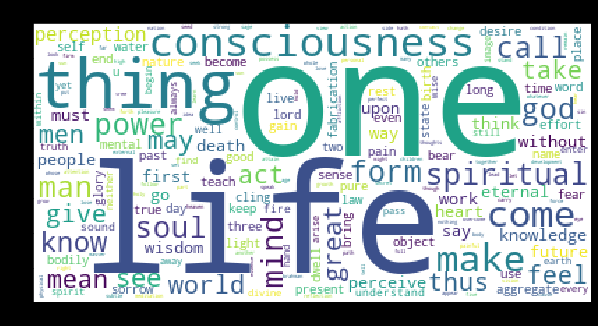

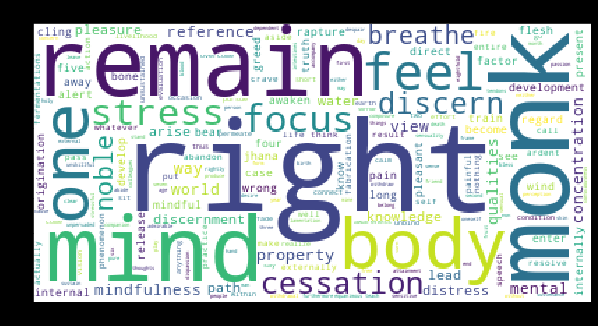

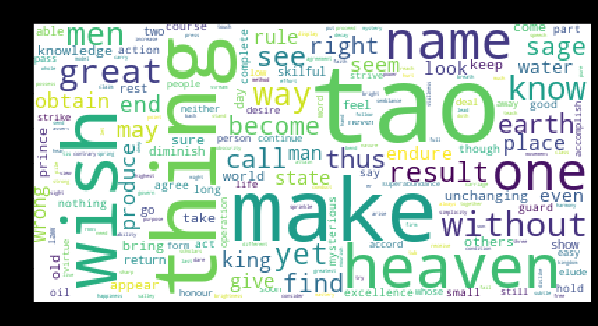

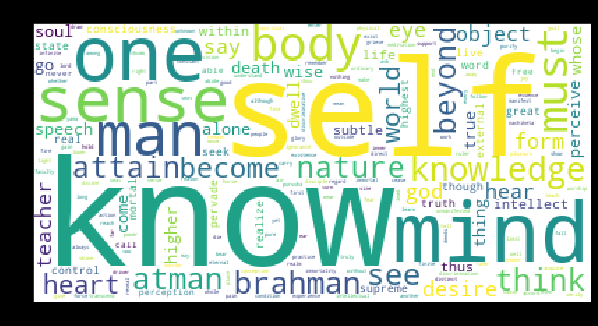

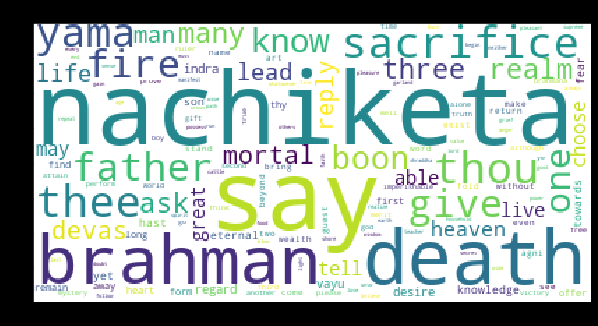

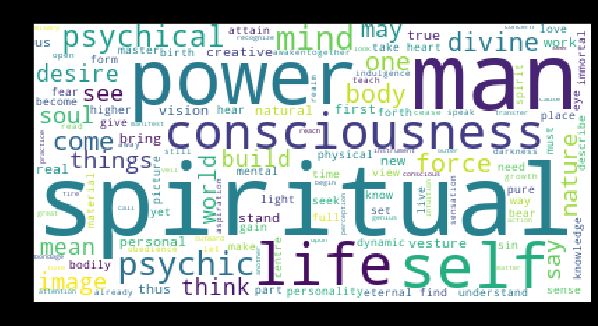

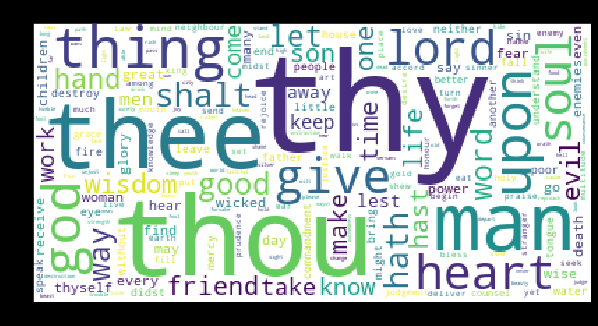

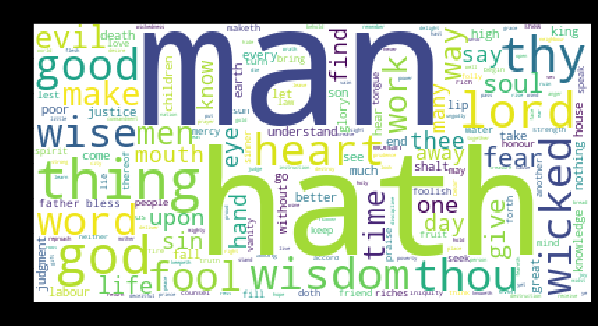

In [107]:
# Plot wordcloud for each Cluster
for n in result_df['Cluster'].unique():
    clusterdata=result_df['Sentence'][result_df['Cluster']==n]
    wordcloud = WordCloud(collocations=False, background_color="white",width=400,height=200)\
    .generate(' '.join(clusterdata))
    plt.figure(figsize=(10,8), facecolor='k') 
    title = "Cluster : "+str(n)
    plt.title(title)
    plt.imshow(wordcloud)

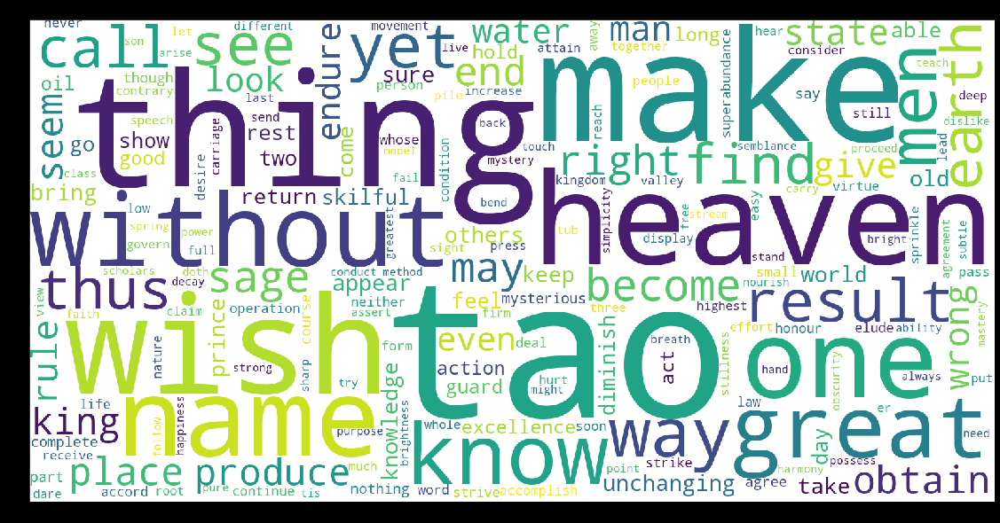

In [91]:
#Plotting each cluster in different cells just for ease of visualization
clusterdata=result_df['Sentence'][result_df['Cluster']==0]
wordcloud = WordCloud(collocations=False, background_color="white",width=1600,height=800)\
.generate(' '.join(clusterdata))
plt.figure(figsize=(10,8), facecolor='k') 
title = "Cluster : "+str(n)
plt.title(title)
plt.imshow(wordcloud)

**Observation:**
1. Cluster 0: Words like act, teach, soul, mind, life come together in Book of Wisdom 
2. Cluster 1: Words like psychic, spiritual, Conciousness, perception come together Yoga Sutra book
3. Cluster 2: Words like Tao, Sage, Heaven come tohether in Tao Te Ching spiritual book
4. Cluster 3: Words like Teacher, nature, heart, object come together in Ecclesiastes
5. Cluster 4: Words like Nachitekta, death, Yama, Vayu, mortal come from Upanishad
6. Cluster 5: Words like Monk, Cessation, discernment come together in Buddhisam book
7. Cluster 6: Words like thee, thy, god, evil, lord come together in book of proverb
8. Cluster 7: Words like wicked, fool, evil are from book of Ecclecisiasticus

### Assign logical names to clusters

In [114]:
# Based on wordCloud assign logical names to the clusters
BookName=['Book of Wisdom','Yoga Sutra','Tao Te Ching', 'Book Of Ecclesiastes', 'Upanishad', 'Buddhisam','Book of Proverb', 'Book of Ecclesiasticus' ]
result_df['Book Name']=labels
result_df['Book Name']=result_df['Book Name'].map({0:BookName[0],1:BookName[1],2:BookName[2], 3:BookName[3], 4:BookName[4]\
                                        ,5:BookName[5], 6:BookName[6], 7:BookName[7]})

result_df

,Sentence,Cluster,Book Name
0,buddha think rahula mirror buddha rahula refle...,5,Buddhisam
1,bless one stay kosambi simsapa tree grove pick...,3,Book Of Ecclesiastes
2,stress know cause stress come play know divers...,3,Book Of Ecclesiastes
3,vision arise clear know arise discernment aris...,3,Book Of Ecclesiastes
4,sariputta three form stressfulness friend stre...,5,Buddhisam
...,...,...,...
584,condemn makers worshippers idols thou god art ...,7,Book of Ecclesiasticus
585,worthily punish destroy multitude beasts inste...,2,Tao Te Ching
586,thy judgments lord great thy word express ther...,5,Buddhisam
587,intercession sedition occasion core thy saint ...,2,Tao Te Ching


In [116]:
result_df[result_df['Book Name']=='Yoga Sutra'] 

,Sentence,Cluster,Book Name
288,versatile psychic nature goal full consciousne...,1,Yoga Sutra
289,egotism perversion spiritual ambition inversio...,1,Yoga Sutra
290,psychic nature power life heritage spiritual m...,1,Yoga Sutra
291,five hindrances book ii psychic nature build i...,1,Yoga Sutra
292,predication sleep memory list mental emotional...,1,Yoga Sutra
297,modify mental power explain term mind image ma...,1,Yoga Sutra
298,cease self indulgence psychical power energies...,1,Yoga Sutra
302,psychical activity establishment spiritual man...,1,Yoga Sutra
316,nature way sickness inertia doubt lightmindedn...,1,Yoga Sutra
330,say without judicial action mind come mental p...,1,Yoga Sutra


### Check KMeans Cluster Purity for k=8, TFIDF, PCA data model

In [135]:
#Read labels and store as list
actual_labels=[]
with open('labels_religions.txt') as f:
    actual_labels = f.readlines()

#remove missing entry in complete docs
actual_labels.remove('Buddhism_Ch14\n')

#create function to drop chapter numbers from book label
def reFormat(inp):
    return re.sub(r'_Ch\d*\n', '',inp)

result_df['Actual'] = actual_labels
result_df['Actual'] = result_df['Actual'].apply(reFormat)

outputClusters = result_df.Actual.groupby(result_df.Cluster).value_counts().unstack(fill_value=0)
 

#compute purity score

purityScore = np.sum(outputClusters.max(axis=1))/len(corpus)
   
print('The purity score for 8 clusters, TFIDF Kmeans model is', purityScore)

The purity score for 8 clusters, TFIDF model is 0.6757215619694398


# KMeans Clustering with K=7, TFPDF, PCA

In [95]:
# Create KMmeans clustering model using TFIDF data & K=7
k=7
km7 = KMeans(n_clusters=k, 
                     init='k-means++',
                     n_init=10,  # make 10 rounds in each iteration to finalize centroid
                     max_iter=300, #Max iterations to finalize centroid
                     random_state=100) 
km7.fit(tf_pca)

labels = km7.labels_  
np.unique(labels)  #3 labels created for 3 clusters

array([0, 1, 2, 3, 4, 5, 6])

In [96]:
# Assign Cluster value to each of the sentencce
result_km7_df = pd.DataFrame(columns=['Sentence','Cluster'])
result_km7_df['Sentence'] = corpus
result_km7_df['Cluster']=labels
result_km7_df['Cluster'] = result_km7_df['Cluster'].astype(int)
result_km7_df

,Sentence,Cluster
0,buddha think rahula mirror buddha rahula refle...,5
1,bless one stay kosambi simsapa tree grove pick...,5
2,stress know cause stress come play know divers...,5
3,vision arise clear know arise discernment aris...,5
4,sariputta three form stressfulness friend stre...,5
...,...,...
584,condemn makers worshippers idols thou god art ...,6
585,worthily punish destroy multitude beasts inste...,4
586,thy judgments lord great thy word express ther...,5
587,intercession sedition occasion core thy saint ...,4


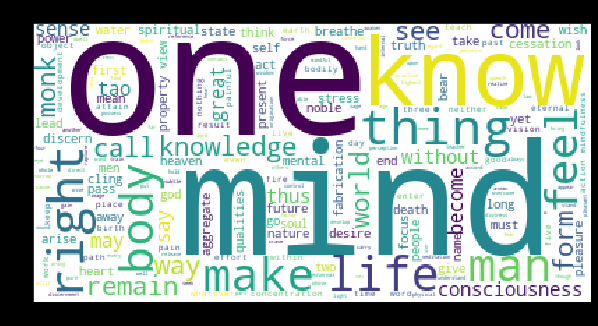

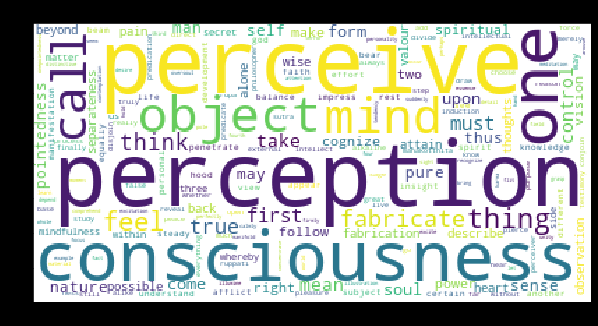

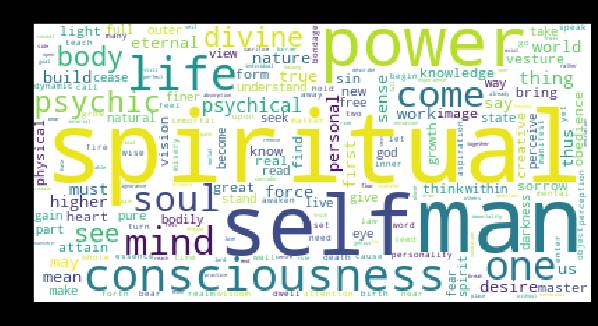

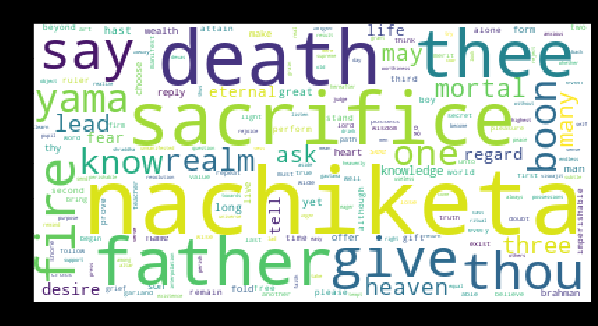

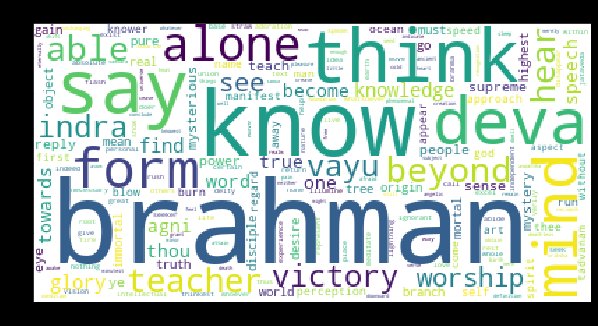

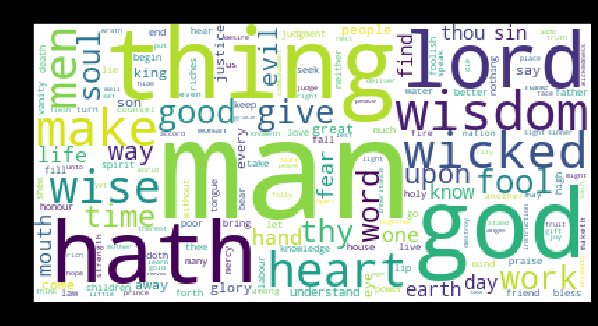

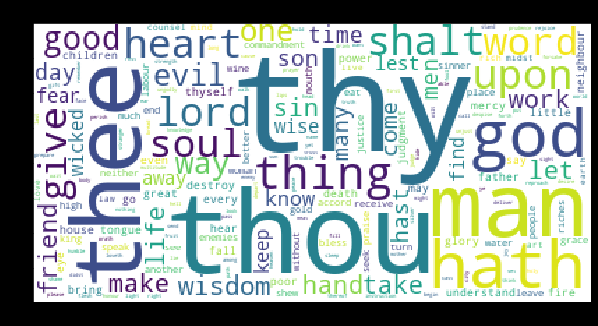

In [108]:
# Plot wordcloud for each Cluster
for n in result_km7_df['Cluster'].unique():
    clusterdata=result_km7_df['Sentence'][result_km7_df['Cluster']==n]
    wordcloud = WordCloud(collocations=False, background_color="white",width=400,height=200)\
    .generate(' '.join(clusterdata))
    plt.figure(figsize=(10,8), facecolor='k') 
    title = "Cluster : "+str(n)
    plt.title(title)
    plt.imshow(wordcloud)

### Check KMeans Cluster Purity for k=7, TFIDF, PCA data model

In [137]:
#Read labels and store as list
actual_labels=[]
with open('labels_religions.txt') as f:
    actual_labels = f.readlines()

#remove missing entry in complete docs
actual_labels.remove('Buddhism_Ch14\n')

#create function to drop chapter numbers from book label
def reFormat(inp):
    return re.sub(r'_Ch\d*\n', '',inp)

result_km7_df['Actual'] = actual_labels
result_km7_df['Actual'] = result_km7_df['Actual'].apply(reFormat)

outputClusters = result_km7_df.Actual.groupby(result_km7_df.Cluster).value_counts().unstack(fill_value=0)
 

#compute purity score

purityScore = np.sum(outputClusters.max(axis=1))/len(corpus)
   
print('The purity score for 7 clusters, TFIDF Kmeans model is', purityScore)

The purity score for 7 clusters, TFIDF model is 0.4940577249575552


# KMeans Clustering with K=5, TFIDF, PCA

In [129]:
# Create KMmeans clustering model using TFIDF data & K=7
k=5
km5 = KMeans(n_clusters=k, 
                     init='k-means++',
                     n_init=10,  # make 10 rounds in each iteration to finalize centroid
                     max_iter=300, #Max iterations to finalize centroid
                     random_state=100) 
km5.fit(tf_pca)

labels = km5.labels_  
np.unique(labels)  #3 labels created for 3 clusters

array([0, 1, 2, 3, 4])

In [130]:
# Assign Cluster value to each of the sentencce
result_km5_df = pd.DataFrame(columns=['Sentence','Cluster'])
result_km5_df['Sentence'] = corpus
result_km5_df['Cluster']=labels
result_km5_df['Cluster'] = result_km5_df['Cluster'].astype(int)
result_km5_df

,Sentence,Cluster
0,buddha think rahula mirror buddha rahula refle...,4
1,bless one stay kosambi simsapa tree grove pick...,4
2,stress know cause stress come play know divers...,4
3,vision arise clear know arise discernment aris...,4
4,sariputta three form stressfulness friend stre...,4
...,...,...
584,condemn makers worshippers idols thou god art ...,3
585,worthily punish destroy multitude beasts inste...,3
586,thy judgments lord great thy word express ther...,4
587,intercession sedition occasion core thy saint ...,3


In [136]:
#Read labels and store as list, for KM5
actual_labels=[]
with open('labels_religions.txt') as f:
    actual_labels = f.readlines()

#remove missing entry in complete docs
actual_labels.remove('Buddhism_Ch14\n')

#create function to drop chapter numbers from book label
def reFormat(inp):
    return re.sub(r'_Ch\d*\n', '',inp)

result_km5_df['Actual'] = actual_labels
result_km5_df['Actual'] = result_km5_df['Actual'].apply(reFormat)

outputClusters = result_km5_df.Actual.groupby(result_km5_df.Cluster).value_counts().unstack(fill_value=0)
 

#compute purity score

purityScore = np.sum(outputClusters.max(axis=1))/len(corpus)
   
print('The purity score for 5 clusters TFIDF Kmeans model is', purityScore)

The purity score for 5 clusters TFIDF model is 0.5840407470288624


# KMeans Clustering with K=7, Count Vectoriser, PCA

In [143]:
# Create KMmeans clustering model using CountVectorizer data
k=8
km = KMeans(n_clusters=k, 
                     init='k-means++',
                     n_init=10,  # make 10 rounds in each iteration to finalize centroid
                     max_iter=300, #Max iterations to finalize centroid
                     random_state=100) 
km.fit(cv_pca)

labels = km.labels_  
np.unique(labels)  #3 labels created for 3 clusters

array([0, 1, 2, 3, 4, 5, 6, 7])

In [144]:
# Assign Cluster value to each of the sentencce
result_cv_df = pd.DataFrame(columns=['Sentence','Cluster'])
result_cv_df['Sentence'] = corpus
result_cv_df['Cluster']=labels
result_cv_df['Cluster'] = result_cv_df['Cluster'].astype(int)
result_cv_df

,Sentence,Cluster
0,buddha think rahula mirror buddha rahula refle...,0
1,bless one stay kosambi simsapa tree grove pick...,0
2,stress know cause stress come play know divers...,0
3,vision arise clear know arise discernment aris...,0
4,sariputta three form stressfulness friend stre...,0
...,...,...
584,condemn makers worshippers idols thou god art ...,6
585,worthily punish destroy multitude beasts inste...,4
586,thy judgments lord great thy word express ther...,0
587,intercession sedition occasion core thy saint ...,6


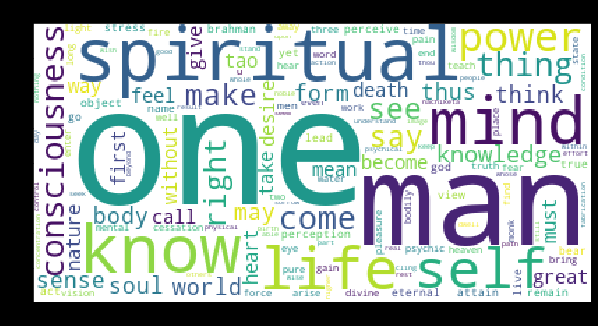

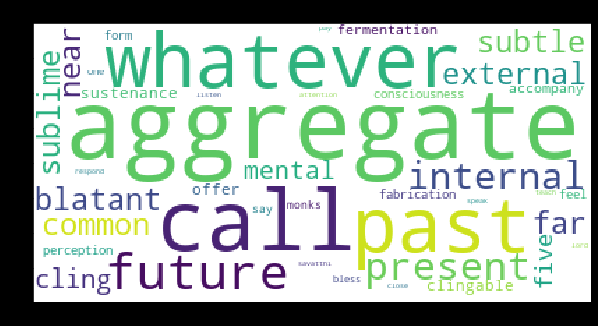

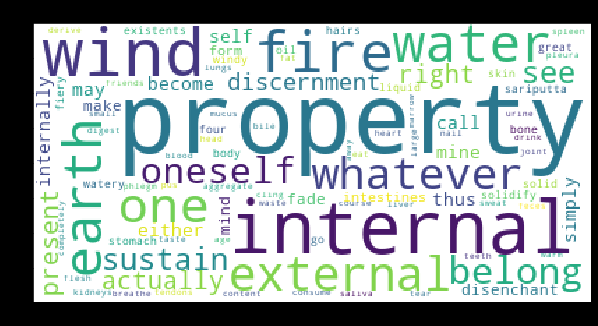

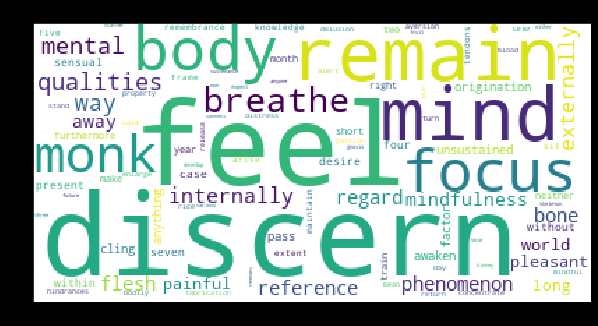

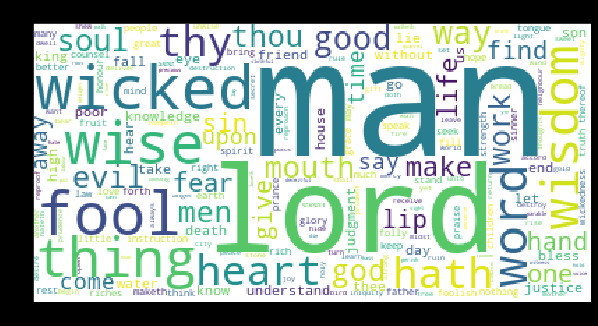

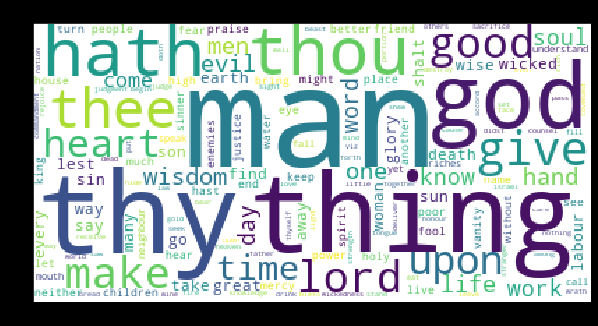

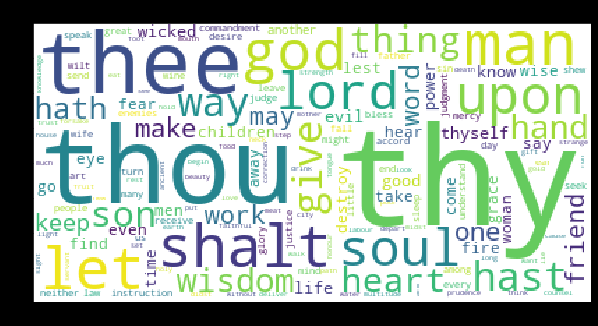

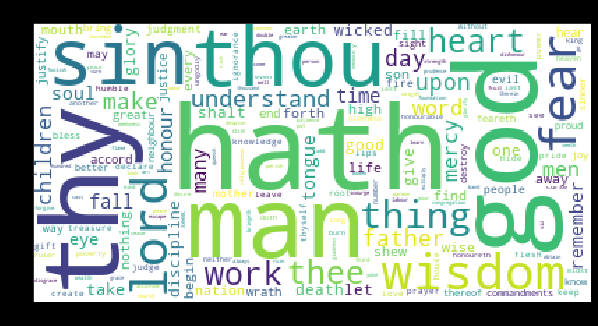

In [124]:
# Plot wordcloud for each Cluster
for n in result_cv_df['Cluster'].unique():
    clusterdata=result_cv_df['Sentence'][result_cv_df['Cluster']==n]
    wordcloud = WordCloud(collocations=False, background_color="white",width=400,height=200)\
    .generate(' '.join(clusterdata))
    plt.figure(figsize=(10,8), facecolor='k') 
    title = "Cluster : "+str(n)
    plt.title(title)
    plt.imshow(wordcloud)

### Check KMeans Cluster Purity for K=8, Count Vectoriser, PCA

In [145]:
#Read labels and store as list
actual_labels=[]
with open('labels_religions.txt') as f:
    actual_labels = f.readlines()

#remove missing entry in complete docs
actual_labels.remove('Buddhism_Ch14\n')

#create function to drop chapter numbers from book label
def reFormat(inp):
    return re.sub(r'_Ch\d*\n', '',inp)

result_cv_df['Actual'] = actual_labels
result_cv_df['Actual'] = result_cv_df['Actual'].apply(reFormat)

outputClusters = result_cv_df.Actual.groupby(result_cv_df.Cluster).value_counts().unstack(fill_value=0)
 

#compute purity score

purityScore = np.sum(outputClusters.max(axis=1))/len(corpus)
   
print('The purity score for 8 cluster, Count Vectorizer KMeans model is', purityScore)

The purity score for 8 cluster, Count Vectorizer KMeans model is 0.41935483870967744


# Hierarchical Clustering

In [139]:
agg_tfpca = pd.DataFrame(tf_pca)

h_cluster = AgglomerativeClustering(n_clusters=8,
                                    affinity='euclidean',
                                    linkage='ward').fit(agg_tfpca.values)


linkage_matrix = linkage(agg_tfpca, 'ward') 

In [141]:
# Assign Cluster value to each of the sentencce
result_agg_df = pd.DataFrame(columns=['Sentence','Cluster'])
result_agg_df['Sentence'] = corpus
result_agg_df['Cluster']=h_cluster.labels_
result_agg_df['Cluster'] = result_agg_df['Cluster'].astype(int)
result_agg_df

,Sentence,Cluster
0,buddha think rahula mirror buddha rahula refle...,6
1,bless one stay kosambi simsapa tree grove pick...,3
2,stress know cause stress come play know divers...,3
3,vision arise clear know arise discernment aris...,3
4,sariputta three form stressfulness friend stre...,1
...,...,...
584,condemn makers worshippers idols thou god art ...,0
585,worthily punish destroy multitude beasts inste...,0
586,thy judgments lord great thy word express ther...,6
587,intercession sedition occasion core thy saint ...,0


### Hierarchical Cluster model Purity for K=8,TFIDF, PCA

In [142]:
#Read labels and store as list
actual_labels=[]
with open('labels_religions.txt') as f:
    actual_labels = f.readlines()

#remove missing entry in complete docs
actual_labels.remove('Buddhism_Ch14\n')

#create function to drop chapter numbers from book label
def reFormat(inp):
    return re.sub(r'_Ch\d*\n', '',inp)

result_agg_df['Actual'] = actual_labels
result_agg_df['Actual'] = result_agg_df['Actual'].apply(reFormat)

outputClusters = result_agg_df.Actual.groupby(result_agg_df.Cluster).value_counts().unstack(fill_value=0)
 

#compute purity score

purityScore = np.sum(outputClusters.max(axis=1))/len(corpus)
   
print('The purity score for 8 cluster,TFIDF Hierarchical clustering model is', purityScore)

The purity score for 8 cluster,TFIDF Hierarchical clustering model is 0.6383701188455009


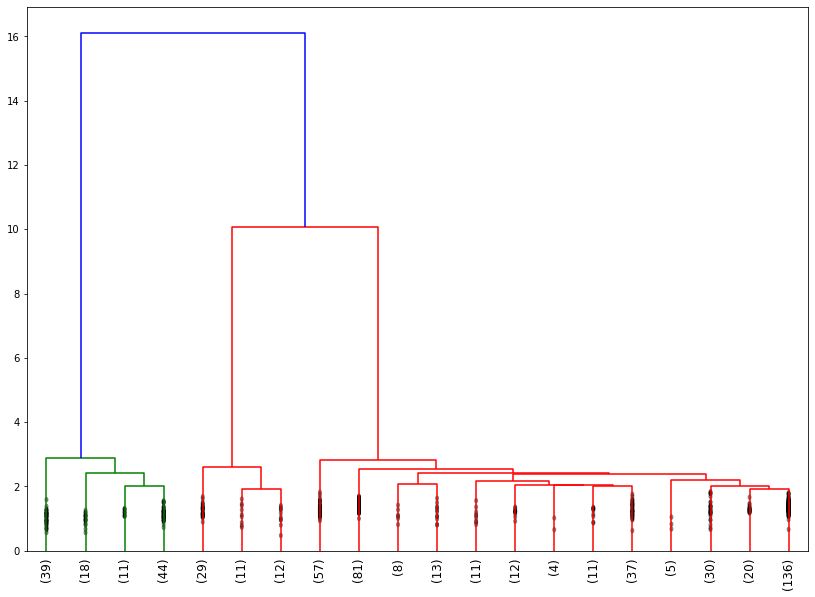

In [123]:
#Plot reduced dendrogram as no. of clusters at bottommost level are not visible
figure = plt.figure(figsize=(14,10)) 
dendrogram(linkage_matrix,     
           truncate_mode='lastp',  # show only the last p merged clusters
           p=20,      # fixing 'p'                  
           leaf_rotation=90.,     
           leaf_font_size=12.,     
           show_contracted=True),  # to get a distribution impression in truncated branches          plt.title('Hierarchical Clustering Dendrogram (Ward, aggrogated)') plt.xlabel('sample index or (cluster size)') plt.ylabel('distance') 
                   
plt.show()


**Observation:**
1. Hierarchical clustering indicates 6 clusters, though not very prominant.

# CONCLUSION

1. We tried two clustering algorithms -

    (a)KMean clustering (b) Hierarchical (Agglomerative) clustering  
    
2. Implemented two Embedding methods (a)TFIDF and (b) Count Vectorizer
3. Implemented 3 methods for optimal K identification 
    (a) Elbow method (b) Silhoutte method  (c) DeD (Depth Difference) method
4. We appled PCA on the embedded data to reduce dimentionality
5. Based on various combinations of methods tried, K-Means with K=8 on TFIDF applied PCAed data is giving the better output.
6. We are able to map 8 clusters to logical names i.e. the spiritual book names. Though some clusters have mixed words as those are present in multiple books, the clusters formed are giving indication about the type of spiritual book.
7. Also Purity score is highest for Kmeans, K=8, TFIDF model (0.67)
